<u><b>Computer Vision

<u><b>Name: Ayush Kumar  </b></u>

<u><b>Enrollment No: 10219051622 </b></u>

<u><b>Lab - 2 : </b></u>   Image enhancement using spatial filtering	

# **OBJECTIVE**

To understand the Image enhancement using spatial filtering	

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

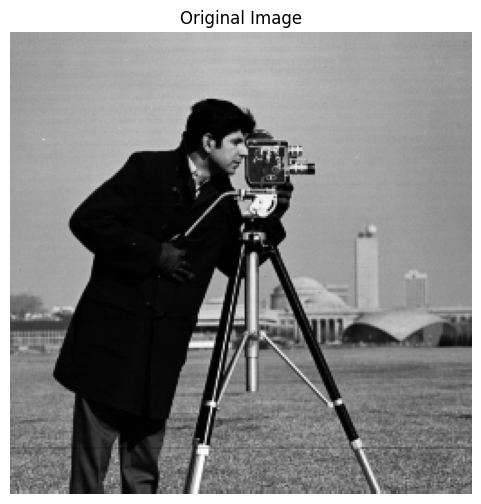

In [3]:
img = cv2.imread(r'H:\My Drive\U.S.A.R\6th Semester\Lab\cameraman.tif', cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
plt.figure(figsize=(6,6))
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

# **ADDING NOISE TO AN IMAGE**

***What is Noise in an Image?***

Noise in an image refers to random variations in brightness or color that are not part of the original scene. It appears as unwanted specks, graininess, or irregular pixels, and often reduces the overall quality and clarity of the image.

***Why Does Noise Occur?***

Noise can be introduced due to several reasons:
- Low lighting conditions, which force the camera to amplify signals.
- Electronic interference from sensors or hardware.
- Errors during image transmission or compression.
- Dust or defects on the camera sensor.

***Common Types of Image Noise***

**Gaussian Noise** - Appears as smooth, grainy variations. Pixel values follow a normal distribution.
**Uniform Noise** - Pixel values are randomly spread within a fixed range. Common in synthetic testing.
**Impulse Noise** -  Also known as *salt-and-pepper noise*. Shows up as sudden black or white dots.

***How the function 'noise' works?***

1. Create a Blank Noise Mask. Initialized it with the same shape as the image.

2. Generate the Selected Noise Type:

- Gaussian Noise: Uses a normal distribution with mean = 128 and standard deviation = 20.
- Uniform Noise: Random values uniformly distributed between 0 and 255.
- Impulse Noise: Randomly sets some pixels to white (255), simulating salt-and-pepper noise.

3. Adjust Intensity: The noise is scaled down (multiplied by 0.5) to avoid overpowering the original image.

4. Add Noise to Image by adding the noise matrix to the original image pixel-wise.

5. Visualize the Process: A 3-part subplot is created to show: The original image, The generated noise, The final noisy image.

In [28]:
def noise(img, noise_type):
    noise = np.zeros(img.shape, dtype=np.uint8)

    if noise_type == 'gaussian':
        cv2.randn(noise, 128, 20)  # mean, stddev
        noise = (noise * 0.5).astype(np.uint8)

    elif noise_type == 'uniform':
        cv2.randu(noise, 0, 255)
        noise = (noise * 0.5).astype(np.uint8)

    elif noise_type == 'impulse':
        cv2.randu(noise, 0, 255)
        noise = cv2.threshold(noise, 245, 255, cv2.THRESH_BINARY)[1]

    else:
        print("Choose a valid noise")

    noisy_img = cv2.add(img, noise)

    fig = plt.figure(dpi=500)
    fig.add_subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.axis("off")
    plt.title("Original")

    fig.add_subplot(1, 3, 2)
    plt.imshow(noise, cmap='gray')
    plt.axis("off")
    plt.title(f"{noise_type} Noise")

    fig.add_subplot(1, 3, 3)
    plt.imshow(noisy_img, cmap='gray')
    plt.axis("off")
    plt.title("Combined")

    plt.show()

    return noisy_img


**GAUSSIAN NOISE**

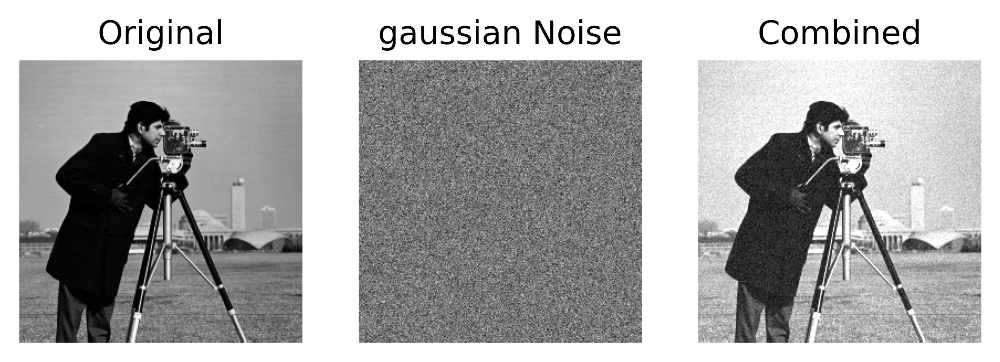

In [29]:
gn_img = noise(img, 'gaussian')

**UNIFORM NOISE**

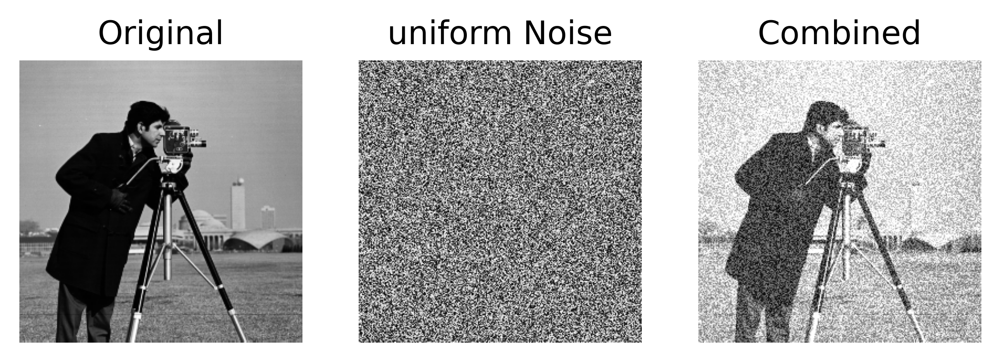

In [30]:
un_img = noise(img, 'uniform')

**IMPULSE NOISE**

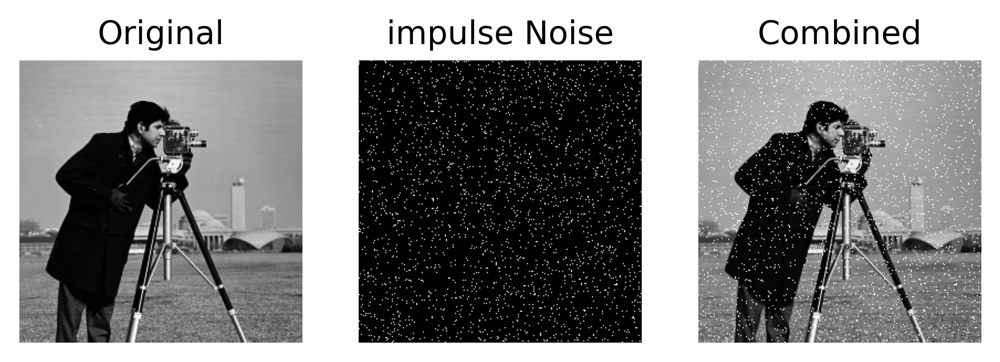

In [31]:
im_img = noise(img, 'impulse')

# **DENOISING AN IMAGE USING BUILT-IN FUNCTION (Non Local Means Denoising)**

***What is Image Denoising?***

Image denoising is the process of removing unwanted noise from an image while preserving important features like edges, textures, and details.

When an image gets corrupted due to factors like poor lighting, sensor errors, or transmission issues, it may contain visual distortions called noise. These distortions degrade the image quality and can affect further analysis or interpretation.

***Why Denoising is Important:***

Enhances visual quality

Improves feature detection (edges, corners, textures)

Helps in medical imaging, satellite imaging, OCR, and more

Essential before tasks like image segmentation or classification.

***What is Non Local Means Denoising?***

Non-Local Means (NLM) Denoising is a smart technique used to remove noise from an image while keeping important details like edges and textures intact. Non-Local Means compares a pixel to other similar-looking patches all over the image

***denoise function***

It uses OpenCV’s cv2.fastNlMeansDenoising() method, which works by:

- Comparing patches of the image
- Identifying similar regions
- Averaging them to remove noise while preserving details.

The function also displays a side-by-side comparison of The Original Image, The Noisy Image, The Denoised Output.

In [32]:
def denoise(original_img, noisy_img, noise_type):

    denoised_img = cv2.fastNlMeansDenoising(noisy_img, None, 10, 10)

    fig = plt.figure(dpi=300)

    fig.add_subplot(1, 3, 1)
    plt.imshow(original_img, cmap='gray')
    plt.axis("off")
    plt.title("Original")

    fig.add_subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.axis("off")
    plt.title(f"with {noise_type} Noise")

    fig.add_subplot(1, 3, 3)
    plt.imshow(denoised_img, cmap='gray')
    plt.axis("off")
    plt.title("After Denoising")

    plt.show()

    return denoised_img


**REMOVING GAUSSIAN NOISE**

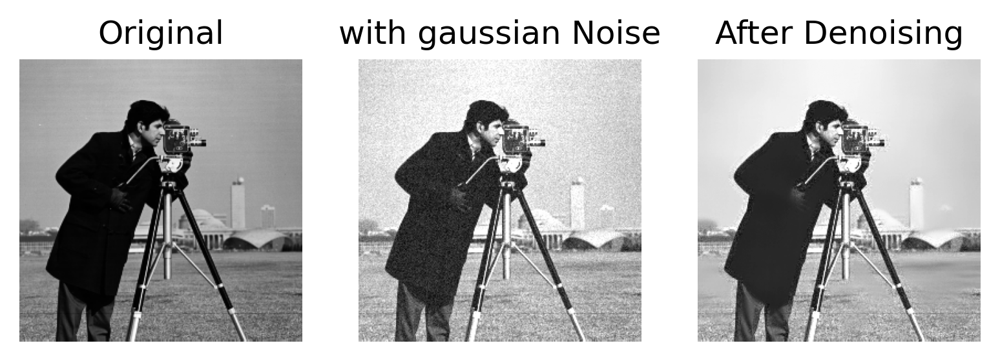

In [33]:
denoised1 = denoise(img, gn_img, 'gaussian')

**REMOVING UNIFORM NOISE**

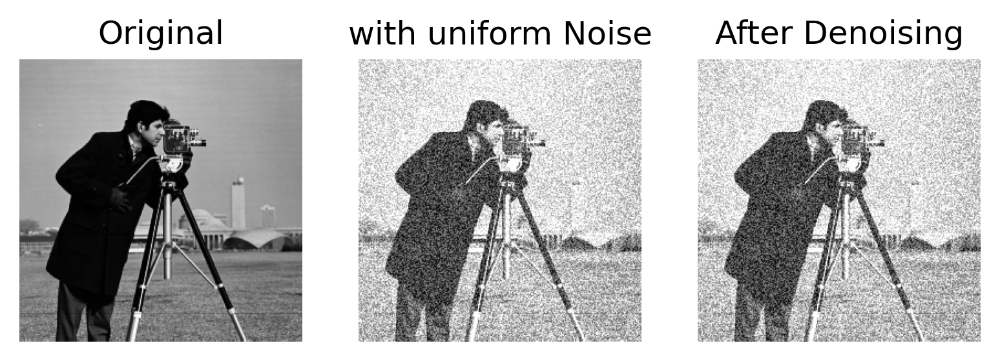

In [34]:
denoised2 = denoise(img, un_img, 'uniform')

**REMOVING IMPULSE NOISE**

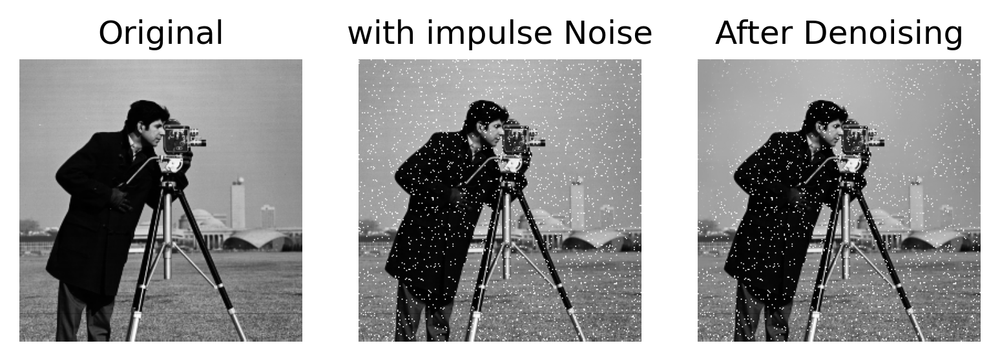

In [35]:
denoised3 = denoise(img, im_img, 'impulse')

# **DENOISING BY APPLYING FILTER**

***What is Denoising by Applying a Median Filter?***

A Median Filter is a simple and effective method used to remove noise from an image, especially salt-and-pepper noise (random black and white pixels).

***How It Works:***

- It looks at a small neighborhood (like 3×3 or 5×5) around each pixel.
- It sorts the pixel values in that neighborhood.
- It replaces the center pixel with the median value (the middle one in the sorted list)

***What is Denoising by Applying a Gaussian Filter?***

A Gaussian Filter is a type of image smoothing technique used to reduce noise and soften the image. It's based on the Gaussian function, which gives more weight to pixels near the center and less to those farther away.

***How It Works:***

- It uses a bell-shaped kernel (like a blur mask) to scan the image.
- Each pixel is replaced with a weighted average of its neighbors.
- Pixels closer to the center have higher influence, while distant pixels have less.

In [36]:
def filter(original_img, noisy_img, noise_type, filter_type="median"):
    if filter_type == "median":
        filtered_img = cv2.medianBlur(noisy_img, 3)
        filter_title = "Median Filter"
    elif filter_type == "gaussian":
        filtered_img = cv2.GaussianBlur(noisy_img, (3, 3), 0)
        filter_title = "Gaussian Filter"
    else:
        print("Choose the proper filter type")

    fig = plt.figure(dpi=300)

    fig.add_subplot(1, 3, 1)
    plt.imshow(original_img, cmap='gray')
    plt.axis("off")
    plt.title("Original")

    fig.add_subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.axis("off")
    plt.title(f"with {noise_type} Noise")

    fig.add_subplot(1, 3, 3)
    plt.imshow(filtered_img, cmap='gray')
    plt.axis("off")
    plt.title(filter_title)

    plt.show()

    return filtered_img

**MEDIAN FILTER ON GAUSSIAN NOISE**

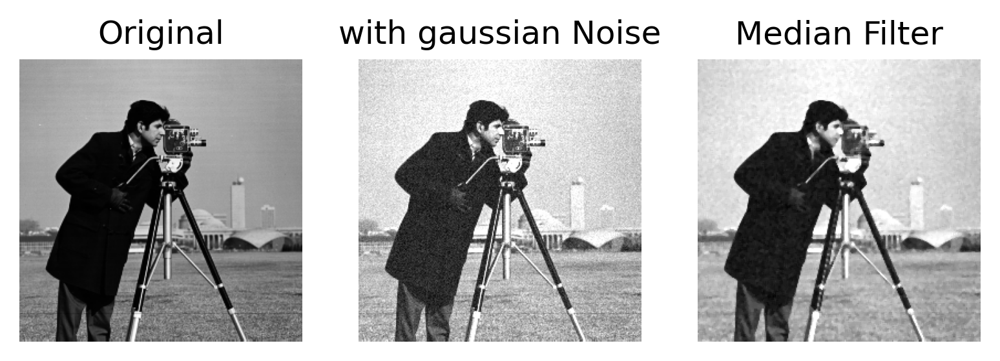

In [37]:
blurred1 = filter(img, gn_img, 'gaussian', 'median')

**MEDIAN FILTER ON UNIFORM NOISE**

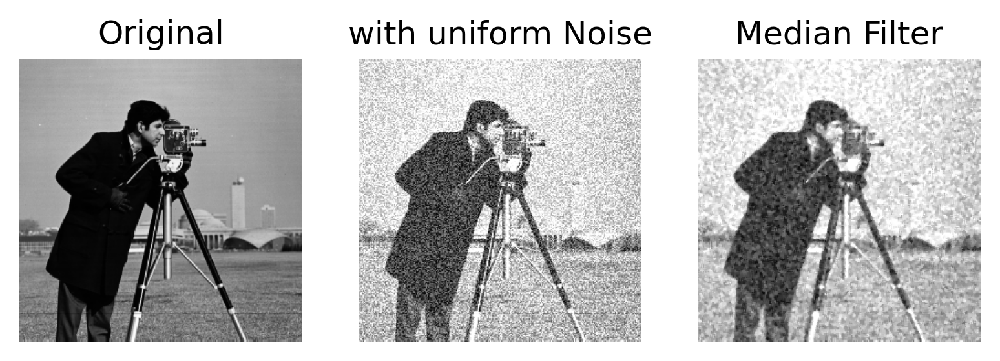

In [38]:
blurred2 = filter(img, un_img, 'uniform', 'median')

**MEDIAN FILTER ON IMPULSE NOISE**

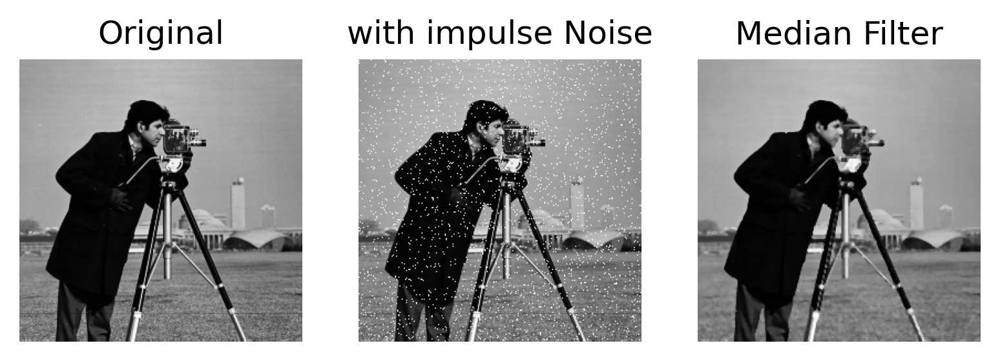

In [39]:
blurred3 = filter(img, im_img, 'impulse', 'median')

**GAUSSIAN FILTER ON GAUSSIAN NOISE**

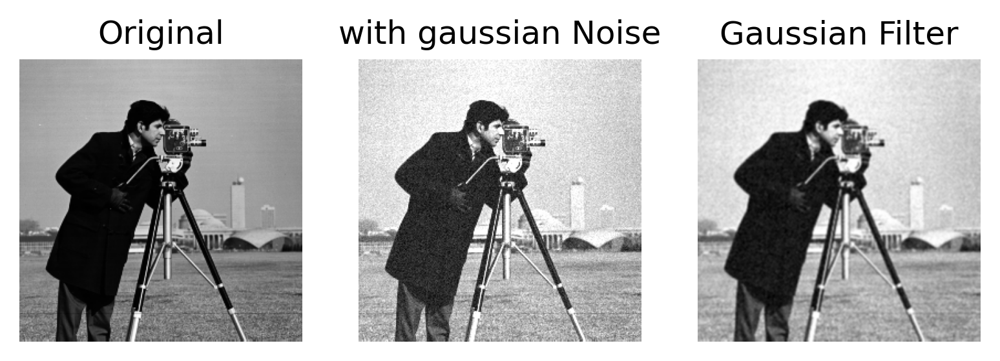

In [40]:
blurred21 = filter(img, gn_img, 'gaussian', 'gaussian')

**GAUSSIAN FILTER ON UNIFORM NOISE**

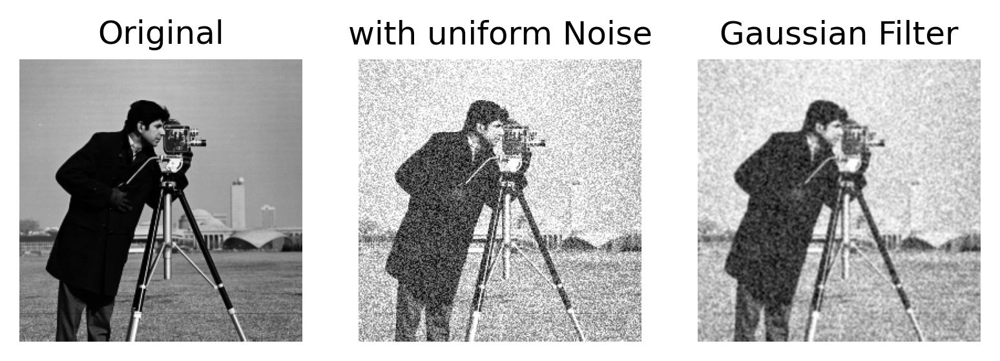

In [41]:
blurred22 = filter(img, un_img, 'uniform', 'gaussian')

**GAUSSIAN FILTER ON IMPULSE NOISE**

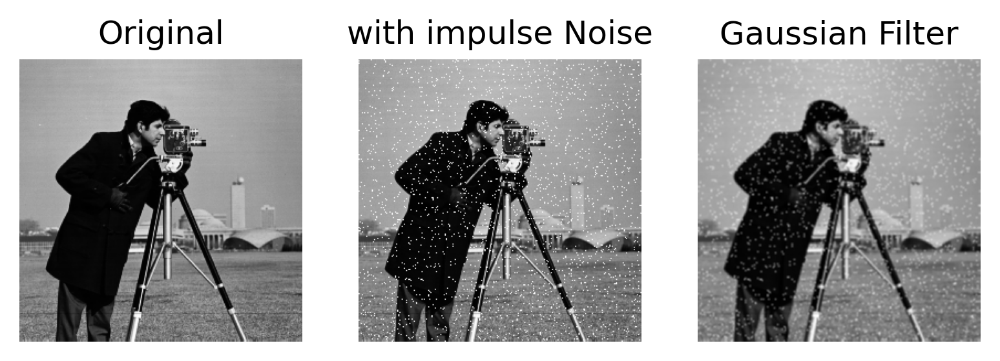

In [42]:
blurred23 = filter(img, im_img, 'impulse', 'gaussian')

​⁫


















# **CONCLUSION -**
This experiment demonstrates how different types of noise affect images and how NLM denoising and various filtering techniques can help reduce them. By comparing visual outputs, we understand the strengths and limitations of each denoising method in preserving image quality.

​⁫









